In [287]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/birdsong-recognition/example_test_audio_metadata.csv
/kaggle/input/birdsong-recognition/sample_submission.csv
/kaggle/input/birdsong-recognition/train.csv
/kaggle/input/birdsong-recognition/test.csv
/kaggle/input/birdsong-recognition/example_test_audio_summary.csv
/kaggle/input/birdsong-recognition/example_test_audio/ORANGE-7-CAP_20190606_093000.pt623.mp3
/kaggle/input/birdsong-recognition/example_test_audio/BLKFR-10-CPL_20190611_093000.pt540.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC153881.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC423355.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC45484.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC109911.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC299486.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC474580.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC299484.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC165233.mp3


# **EDA**

In [288]:
df=pd.read_csv('/kaggle/input/birdsong-recognition/train.csv')

In [289]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...


In [290]:
pd.set_option('display.max_columns',None)

In [291]:
pd.set_option('display.expand_frame_repr', False)

In [292]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     19575 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         19575 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

In [293]:
df['rating'].unique()

array([3.5, 4. , 4.5, 5. , 3. , 2.5, 1.5, 1. , 2. , 0.5, 0. ])

In [294]:
df.playback_used.unique()

array(['no', nan, 'yes'], dtype=object)

In [295]:
df.playback_used.value_counts()

playback_used
no     18964
yes      611
Name: count, dtype: int64

In [296]:
df.playback_used.fillna('no',inplace = True)


In [297]:
df.playback_used.unique()

array(['no', 'yes'], dtype=object)

In [298]:
df.channels.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: channels
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [299]:
df.channels.unique()

array(['1 (mono)', '2 (stereo)'], dtype=object)

In [300]:
df.date.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: date
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [301]:
df.date.unique()

array(['2013-05-25', '2013-05-27', '2013-05-30', ..., '2009-05-07',
       '2019-01-04', '2019-09-25'], dtype=object)

In [302]:
df[['year', 'month', 'day']] = df['date'].str.split('-', expand=True)

In [303]:
df.month.unique()

array(['05', '06', '07', '02', '12', '04', '11', '03', '10', '09', '01',
       '08', '00'], dtype=object)

In [304]:
df.month.value_counts()

month
05    4562
06    4533
04    2529
07    2020
03    1674
08    1099
02     916
11     831
10     820
01     819
12     802
09     736
00      34
Name: count, dtype: int64

In [305]:
df['month'] = df['month'].replace('00', '05')

In [306]:
df = df.drop(['year', 'day'], axis=1)

In [307]:
df.ebird_code.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: ebird_code
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [308]:
df.ebird_code.unique()

array(['aldfly', 'ameavo', 'amebit', 'amecro', 'amegfi', 'amekes',
       'amepip', 'amered', 'amerob', 'amewig', 'amewoo', 'amtspa',
       'annhum', 'astfly', 'baisan', 'baleag', 'balori', 'banswa',
       'barswa', 'bawwar', 'belkin1', 'belspa2', 'bewwre', 'bkbcuc',
       'bkbmag1', 'bkbwar', 'bkcchi', 'bkchum', 'bkhgro', 'bkpwar',
       'bktspa', 'blkpho', 'blugrb1', 'blujay', 'bnhcow', 'boboli',
       'bongul', 'brdowl', 'brebla', 'brespa', 'brncre', 'brnthr',
       'brthum', 'brwhaw', 'btbwar', 'btnwar', 'btywar', 'buffle',
       'buggna', 'buhvir', 'bulori', 'bushti', 'buwtea', 'buwwar',
       'cacwre', 'calgul', 'calqua', 'camwar', 'cangoo', 'canwar',
       'canwre', 'carwre', 'casfin', 'caster1', 'casvir', 'cedwax',
       'chispa', 'chiswi', 'chswar', 'chukar', 'clanut', 'cliswa',
       'comgol', 'comgra', 'comloo', 'commer', 'comnig', 'comrav',
       'comred', 'comter', 'comyel', 'coohaw', 'coshum', 'cowscj1',
       'daejun', 'doccor', 'dowwoo', 'dusfly', 'eargre',

In [309]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [310]:
df.ebird_code.nunique()

264

In [311]:
df.month.unique()

array(['05', '06', '07', '02', '12', '04', '11', '03', '10', '09', '01',
       '08'], dtype=object)

In [312]:
df.pitch.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: pitch
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [313]:
df.pitch.unique()

array(['Not specified', 'both', 'increasing', 'level', 'decreasing'],
      dtype=object)

In [314]:
df.pitch.value_counts()

pitch
Not specified    15155
level             3149
both              2077
decreasing         528
increasing         466
Name: count, dtype: int64

In [315]:
df.speed.value_counts()

speed
Not specified    15046
level             5079
both               782
accelerating       326
decelerating       142
Name: count, dtype: int64

In [316]:
df.species.value_counts()

species
Alder Flycatcher        100
Pied-billed Grebe       100
Northern Waterthrush    100
Field Sparrow           100
Evening Grosbeak        100
                       ... 
LeConte's Thrasher       20
Costa's Hummingbird      19
Hooded Merganser         19
Bufflehead               15
Redhead                   9
Name: count, Length: 264, dtype: int64

In [317]:
df.title.unique()

array(['XC134874 Alder Flycatcher (Empidonax alnorum)',
       'XC135454 Alder Flycatcher (Empidonax alnorum)',
       'XC135455 Alder Flycatcher (Empidonax alnorum)', ...,
       'XC501230 Yellow-throated Vireo (Vireo flavifrons)',
       'XC54828 Yellow-throated Vireo (Vireo flavifrons)',
       'XC55761 Yellow-throated Vireo (Vireo flavifrons)'], dtype=object)

In [318]:
df.title.nunique()

21375

In [319]:
df.number_of_notes.unique()

array(['Not specified', '1-3', '4-6', '7-20', '>20'], dtype=object)

In [320]:
df.secondary_labels.nunique()

5385

In [321]:
df.secondary_labels.unique()

array(["['Empidonax minimus_Least Flycatcher', 'Leiothlypis peregrina_Tennessee Warbler', 'Dumetella carolinensis_Gray Catbird', 'Spizella pusilla_Field Sparrow']",
       '[]',
       "['Dumetella carolinensis_Gray Catbird', 'Bombycilla cedrorum_Cedar Waxwing']",
       ...,
       "['Dryobates pubescens_Downy Woodpecker', 'Polioptila caerulea_Blue-gray Gnatcatcher', 'Setophaga americana_Northern Parula', 'Cardinalis cardinalis_Northern Cardinal', 'Buteo lineatus_Red-shouldered Hawk']",
       "['Vireo olivaceus_Red-eyed Vireo', 'Polioptila caerulea_Blue-gray Gnatcatcher']",
       "['Setophaga dominica_Yellow-throated Warbler']"], dtype=object)

In [322]:
df.bird_seen.value_counts()

bird_seen
yes    16211
no      3364
Name: count, dtype: int64

In [323]:
df.bird_seen.fillna('yes', inplace=True)

In [324]:
df.bird_seen.unique()

array(['yes', 'no'], dtype=object)

In [325]:
df.sci_name.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: sci_name
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [326]:
df.sci_name.nunique()

264

In [327]:
df.sci_name.unique()

array(['Empidonax alnorum', 'Recurvirostra americana',
       'Botaurus lentiginosus', 'Corvus brachyrhynchos', 'Spinus tristis',
       'Falco sparverius', 'Anthus rubescens', 'Setophaga ruticilla',
       'Turdus migratorius', 'Mareca americana', 'Scolopax minor',
       'Spizelloides arborea', 'Calypte anna', 'Myiarchus cinerascens',
       'Calidris bairdii', 'Haliaeetus leucocephalus', 'Icterus galbula',
       'Riparia riparia', 'Hirundo rustica', 'Mniotilta varia',
       'Megaceryle alcyon', 'Artemisiospiza belli', 'Thryomanes bewickii',
       'Coccyzus erythropthalmus', 'Pica hudsonia', 'Setophaga fusca',
       'Poecile atricapillus', 'Archilochus alexandri',
       'Pheucticus melanocephalus', 'Setophaga striata',
       'Amphispiza bilineata', 'Sayornis nigricans', 'Passerina caerulea',
       'Cyanocitta cristata', 'Molothrus ater', 'Dolichonyx oryzivorus',
       'Chroicocephalus philadelphia', 'Strix varia',
       'Euphagus cyanocephalus', 'Spizella breweri', 'Certhia 

In [328]:
df.location.unique()

array([' Grey Cloud Dunes SNA, Washington, Minnesota',
       " Carver's Gap Parking area, Roan Mountain State Park, North Carolina",
       ' Scales, near Wilson Creek, Grayson, Virginia', ...,
       ' Sprewell Bluff WMA, Pigeon Creek Tract',
       ' Mimbres, Grant County, New Mexico',
       ' Park Headquarters Rd W, Sugarlands, Great Smoky Mountains National Park, Tennessee'],
      dtype=object)

In [329]:
df.location.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: location
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [330]:
df.latitude

0         44.793
1        36.1065
2        36.1065
3        36.1065
4        36.1065
          ...   
21370    39.5734
21371    38.3619
21372    38.3619
21373    36.0008
21374    35.6878
Name: latitude, Length: 21375, dtype: object

In [331]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     21375 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         21375 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

In [332]:
df.sampling_rate.unique()

array(['48000 (Hz)', '44100 (Hz)', '16000 (Hz)', '22050 (Hz)',
       '24000 (Hz)', '32000 (Hz)', '8000 (Hz)', '11025 (Hz)'],
      dtype=object)

In [333]:
df = df.drop('sampling_rate', axis=1)

In [334]:
 df = df.drop('type', axis=1)

In [335]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     21375 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         21375 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

In [336]:
df.elevation.unique()

array(['220 m', '1700 m', '1400 m', '190 m', '588 m', '10 m', '0 m',
       '550 m', '260 m', '20 m', '380 m', '210 m', '1600 m', '90 m',
       '300 m', '30 m', '180 m', '1100 m', '750 m', '500 m', '600 m',
       '440 m', '1000 m', '60 m', '50 m', '320 m', '70 m', '400 m',
       '189 m', '40 m', '250 m', '280 m', '800 m', '100 m', '240 m',
       '170 m', '1300 m', '850 m', '1900 m', '460 m', '1800 m', '2200 m',
       '120 m', '-70 m', '2 m', '420 m', '599 m', '1500 m', '340 m',
       '2500 m', '2700 m', '700 m', '8 m', '480 m', '80 m', '130 m',
       '2000 m', '2100 m', '200 m', '5 m', '110 m', '360 m', '140 m',
       '2900 m', '1450 m', '1780 m', '2400 m', '900 m', '1200 m', '-50 m',
       '2600 m', '160 m', '45 m', '2800 m', '? m', '75 m', '2885 m',
       '3400 m', '3500 m', '-30 m', '3200 m', '3100 m', '3300 m',
       '1650 m', '-240 m', '-10 m', '450 m', '285 m', '650 m', '950 m',
       '350 m', '802 m', '150 m', '1 m', '607 m', '1072 m', '270 m',
       '175 m', '185 m

In [337]:
df.elevation.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: elevation
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [338]:
df['elevation'] = df['elevation'].str.replace(' m','', regex=True)

In [339]:
df.elevation.unique()

array(['220', '1700', '1400', '190', '588', '10', '0', '550', '260', '20',
       '380', '210', '1600', '90', '300', '30', '180', '1100', '750',
       '500', '600', '440', '1000', '60', '50', '320', '70', '400', '189',
       '40', '250', '280', '800', '100', '240', '170', '1300', '850',
       '1900', '460', '1800', '2200', '120', '-70', '2', '420', '599',
       '1500', '340', '2500', '2700', '700', '8', '480', '80', '130',
       '2000', '2100', '200', '5', '110', '360', '140', '2900', '1450',
       '1780', '2400', '900', '1200', '-50', '2600', '160', '45', '2800',
       '?', '75', '2885', '3400', '3500', '-30', '3200', '3100', '3300',
       '1650', '-240', '-10', '450', '285', '650', '950', '350', '802',
       '150', '1', '607', '1072', '270', '175', '185', '888', '710', '44',
       '3700', '4600', '3680', '3880', '3850', '4232', '4500', '2300',
       '218', '15', '3', '18', '337', '2090', '1850', '2050', '1,650',
       '2550', '3.10', '4', '1267', '2330', '125', '488', '22

In [340]:
df['elevation'] = df['elevation'].replace('?', np.nan)
df['elevation'] = df['elevation'].replace('0', np.nan)
df['elevation'] = df['elevation'].replace('-', np.nan)
df['elevation'] = df['elevation'].replace('Unknown', np.nan)
df['elevation'] = df['elevation'].replace('', np.nan)
df['elevation'] = df['elevation'].replace('??', np.nan)


In [341]:
df.elevation.unique()

array(['220', '1700', '1400', '190', '588', '10', nan, '550', '260', '20',
       '380', '210', '1600', '90', '300', '30', '180', '1100', '750',
       '500', '600', '440', '1000', '60', '50', '320', '70', '400', '189',
       '40', '250', '280', '800', '100', '240', '170', '1300', '850',
       '1900', '460', '1800', '2200', '120', '-70', '2', '420', '599',
       '1500', '340', '2500', '2700', '700', '8', '480', '80', '130',
       '2000', '2100', '200', '5', '110', '360', '140', '2900', '1450',
       '1780', '2400', '900', '1200', '-50', '2600', '160', '45', '2800',
       '75', '2885', '3400', '3500', '-30', '3200', '3100', '3300',
       '1650', '-240', '-10', '450', '285', '650', '950', '350', '802',
       '150', '1', '607', '1072', '270', '175', '185', '888', '710', '44',
       '3700', '4600', '3680', '3880', '3850', '4232', '4500', '2300',
       '218', '15', '3', '18', '337', '2090', '1850', '2050', '1,650',
       '2550', '3.10', '4', '1267', '2330', '125', '488', '2250', 

In [342]:
df['elevation'] = df['elevation'].str.replace('m', '')


In [343]:
df['elevation'].unique()

array(['220', '1700', '1400', '190', '588', '10', nan, '550', '260', '20',
       '380', '210', '1600', '90', '300', '30', '180', '1100', '750',
       '500', '600', '440', '1000', '60', '50', '320', '70', '400', '189',
       '40', '250', '280', '800', '100', '240', '170', '1300', '850',
       '1900', '460', '1800', '2200', '120', '-70', '2', '420', '599',
       '1500', '340', '2500', '2700', '700', '8', '480', '80', '130',
       '2000', '2100', '200', '5', '110', '360', '140', '2900', '1450',
       '1780', '2400', '900', '1200', '-50', '2600', '160', '45', '2800',
       '75', '2885', '3400', '3500', '-30', '3200', '3100', '3300',
       '1650', '-240', '-10', '450', '285', '650', '950', '350', '802',
       '150', '1', '607', '1072', '270', '175', '185', '888', '710', '44',
       '3700', '4600', '3680', '3880', '3850', '4232', '4500', '2300',
       '218', '15', '3', '18', '337', '2090', '1850', '2050', '1,650',
       '2550', '3.10', '4', '1267', '2330', '125', '488', '2250', 

In [344]:
df.description.unique()

array(['Two short segments of fairly quiet *pip* calls (at 0:01.2, 0:07.5, etc) from a migrant bird foraging in scrub at edge of the prairie.  Also a more emphatic call at the end of the first segment (0:18.6) as it was taking flight.\r\n\r\nRecorded with homemade parabolic reflector.',
       'At least three birds seen here moving around some stunted alders and Fraser Firs. img:http://www.flickr.com/photos/madbirder/8884100252/in/photostream/',
       'At least three birds seen chasing each other around stunted alders and Fraser Firs. img:http://www.flickr.com/photos/madbirder/8884100252/in/photostream/',
       ..., 'From edge of deciduous forest about 50ft away.',
       'Field Number: VA2017 JRS 09',
       'Field Number: VA2017 JRS 24; close and visible, ~15 ft away'],
      dtype=object)

In [345]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,05
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05


In [346]:
df.description.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: description
Non-Null Count  Dtype 
--------------  ----- 
15176 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [347]:
df = df.drop('description', axis=1)

In [348]:
df.bitrate_of_mp3

0        192000 (bps)
1        128000 (bps)
2        128000 (bps)
3        128000 (bps)
4        128000 (bps)
             ...     
21370    192000 (bps)
21371    256000 (bps)
21372    256000 (bps)
21373    128000 (bps)
21374    128000 (bps)
Name: bitrate_of_mp3, Length: 21375, dtype: object

In [349]:
df = df.drop('bitrate_of_mp3', axis=1)

In [350]:
df.file_type.value_counts()

file_type
mp3    21367
wav        6
mp2        1
aac        1
Name: count, dtype: int64

In [351]:
df['volume'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: volume
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [352]:
df = df.drop('volume', axis=1)

In [353]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,elevation,file_type,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,mp3,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,05
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05


In [354]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     21375 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         21375 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

In [355]:
df['background'].unique()

array(['American Yellow Warbler (Setophaga aestiva); Least Flycatcher (Empidonax minimus); Tennessee Warbler (Leiothlypis peregrina); Grey Catbird (Dumetella carolinensis); Field Sparrow (Spizella pusilla)',
       nan,
       'Grey Catbird (Dumetella carolinensis); Cedar Waxwing (Bombycilla cedrorum)',
       ...,
       'Downy Woodpecker (Dryobates pubescens); Blue-grey Gnatcatcher (Polioptila caerulea); Northern Parula (Setophaga americana); Northern Cardinal (Cardinalis cardinalis); Red-shouldered Hawk (Buteo lineatus)',
       'Red-eyed Vireo (Vireo olivaceus); Blue-grey Gnatcatcher (Polioptila caerulea)',
       'Yellow-throated Warbler (Setophaga dominica)'], dtype=object)

In [356]:
df = df.drop('background', axis=1)

In [357]:
df.xc_id.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: xc_id
Non-Null Count  Dtype
--------------  -----
21375 non-null  int64
dtypes: int64(1)
memory usage: 167.1 KB


In [358]:
df = df.drop('xc_id', axis=1)

In [359]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,elevation,file_type,url,country,author,primary_label,longitude,length,time,recordist,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,mp3,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,05
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05


In [360]:
df = df.drop('url', axis=1)

In [361]:
df = df.drop('author', axis=1)

In [362]:
df = df.drop('primary_label', axis=1)

In [363]:
df['length'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: length
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [364]:
df['length']

0        Not specified
1               0-3(s)
2               0-3(s)
3               0-3(s)
4               0-3(s)
             ...      
21370           0-3(s)
21371    Not specified
21372    Not specified
21373           >10(s)
21374           >10(s)
Name: length, Length: 21375, dtype: object

In [365]:
df.time.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: time
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [366]:
df.time.nunique

<bound method IndexOpsMixin.nunique of 0           8:00
1          08:30
2          08:30
3          08:30
4          08:30
          ...   
21370      13:00
21371      15:00
21372      13:30
21373     9:45am
21374    11:30am
Name: time, Length: 21375, dtype: object>

In [367]:
df.time.unique

<bound method Series.unique of 0           8:00
1          08:30
2          08:30
3          08:30
4          08:30
          ...   
21370      13:00
21371      15:00
21372      13:30
21373     9:45am
21374    11:30am
Name: time, Length: 21375, dtype: object>

In [368]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,elevation,file_type,country,longitude,length,time,recordist,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,mp3,United States,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,05
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,05


In [369]:
df = df.drop('recordist', axis=1)

In [370]:
df.license.unique()

array(['Creative Commons Attribution-ShareAlike 3.0',
       'Creative Commons Attribution-NonCommercial-ShareAlike 3.0',
       'Creative Commons Attribution-NonCommercial-ShareAlike 4.0',
       'Creative Commons Attribution-ShareAlike 4.0'], dtype=object)

In [371]:
df.shape

(21375, 25)

In [372]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'country', 'longitude', 'length', 'time',
       'license', 'month'],
      dtype='object')

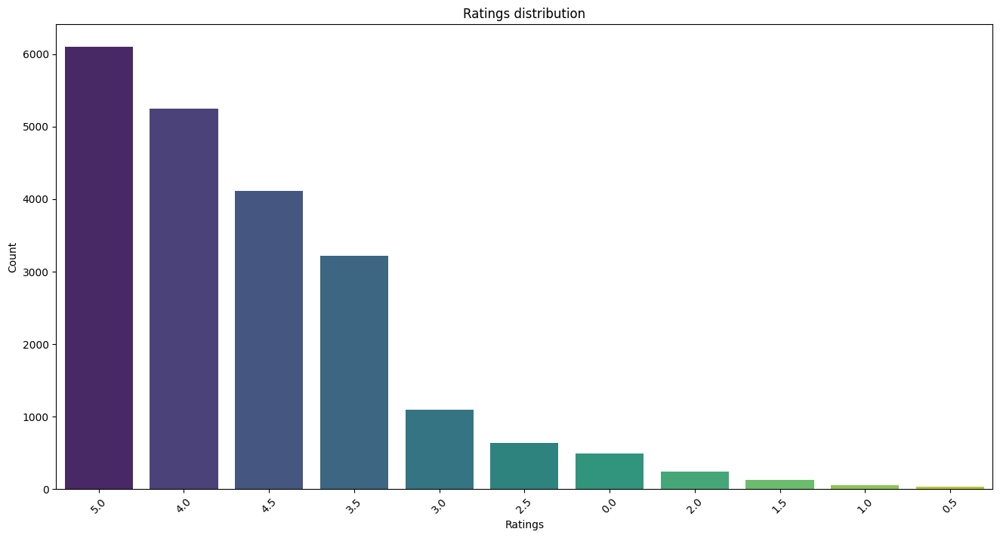

In [373]:
plt.figure(figsize = (16,8))

sns.countplot( x='rating', data = df, order = df['rating'].value_counts().index, palette = 'viridis')
plt.title("Ratings distribution")
plt.xlabel("Ratings")
plt.ylabel("Count")
plt.xticks(rotation = 45)
plt.show()

In [374]:
df['month']=df['month'].astype(int)

In [375]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     21375 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         21375 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

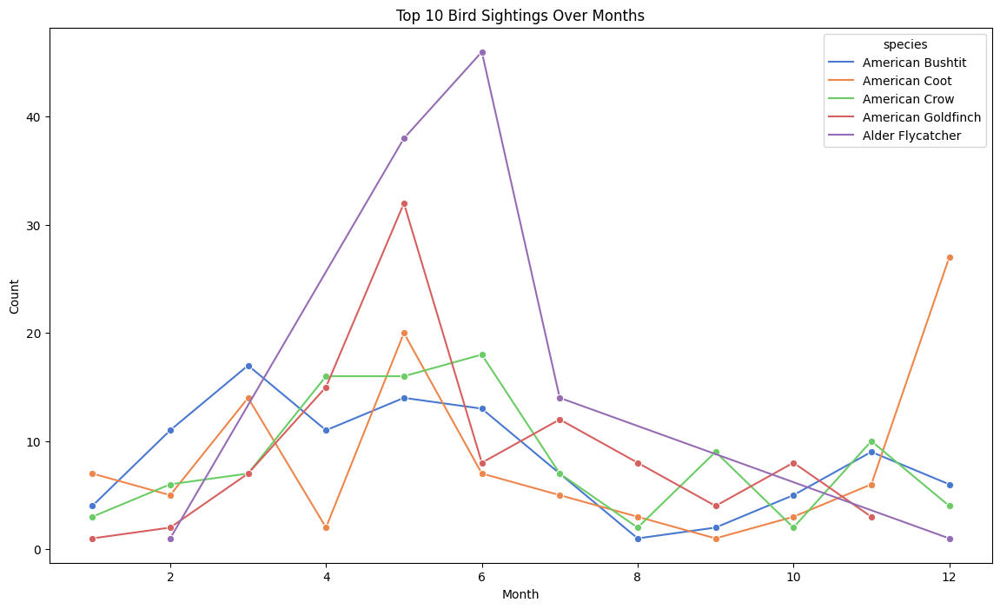

In [376]:
bird_month_counts = df.groupby(['month', 'species']).size().reset_index(name='Count')

# Find the top 10 birds based on overall sightings
top_birds = bird_month_counts.groupby('species')['Count'].sum().nlargest(5).index

# Filter the data for the top 10 birds
top_bird_month_counts = bird_month_counts[bird_month_counts['species'].isin(top_birds)]

# Create a line plot using Seaborn
plt.figure(figsize=(14, 8))
sns.lineplot(x='month', y='Count', hue='species', data=top_bird_month_counts, marker='o', palette='muted')
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Top 10 Bird Sightings Over Months')
plt.legend(title='species', bbox_to_anchor=(1, 1))
plt.show()

In [377]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,elevation,file_type,country,longitude,length,time,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,mp3,United States,-92.962,Not specified,8:00,Creative Commons Attribution-ShareAlike 3.0,5
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Creative Commons Attribution-NonCommercial-Sha...,5
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Creative Commons Attribution-NonCommercial-Sha...,5
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Creative Commons Attribution-NonCommercial-Sha...,5
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Creative Commons Attribution-NonCommercial-Sha...,5


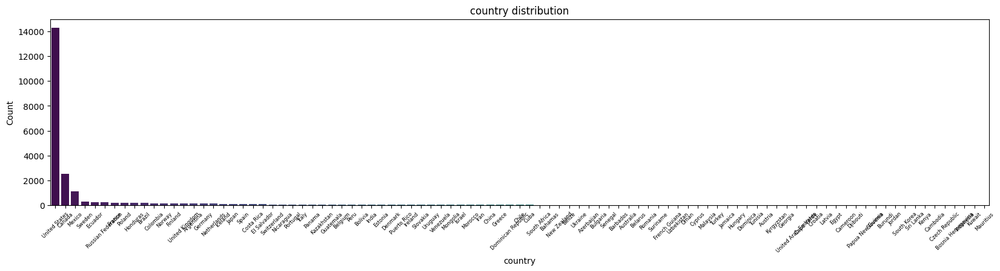

In [378]:
plt.figure(figsize = (20,4))

sns.countplot( x='country', data = df, order = df['country'].value_counts().index, palette = 'viridis')
plt.title("country distribution")
plt.xlabel("country")
plt.ylabel("Count")
plt.xticks(rotation = 45)
plt.xticks(fontsize=6)

plt.show()

# Feature Extraction

In [379]:
unique_values = df['species'].unique()[:5]
unique_values

array(['Alder Flycatcher', 'American Avocet', 'American Bittern',
       'American Crow', 'American Goldfinch'], dtype=object)

In [380]:
dfs = []

# Extracting 2 rows for each unique value
for value in unique_values:
    # Filter rows based on the unique value
    subset = df[df['species'] == value].head(2)
    
    # Append the subset to the result DataFrame
    dfs.append(subset)

df_for_FE = pd.concat(dfs, ignore_index=True)
df_for_FE

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,elevation,file_type,country,longitude,length,time,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,mp3,United States,-92.962,Not specified,8:00,Creative Commons Attribution-ShareAlike 3.0,5
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Creative Commons Attribution-NonCommercial-Sha...,5
2,3.5,no,ameavo,1 (mono),2012-04-21,Not specified,10,XC133080.mp3,Not specified,American Avocet,Not specified,XC133080 American Avocet (Recurvirostra americ...,['Melospiza melodia_Song Sparrow'],yes,Recurvirostra americana,"Palo Alto Baylands, Santa Clara, California",37.46,NaN,mp3,United States,-122.105,Not specified,07:40,Creative Commons Attribution-ShareAlike 3.0,4
3,4.0,no,ameavo,1 (mono),2013-04-30,Not specified,18,XC139829.mp3,Not specified,American Avocet,Not specified,XC139829 American Avocet (Recurvirostra americ...,[],yes,Recurvirostra americana,"Cheyenne, Laramie, Wyoming",41.1267,1800,mp3,United States,-104.697,Not specified,09:00,Creative Commons Attribution-NonCommercial-Sha...,4
4,2.5,no,amebit,2 (stereo),2013-03-25,increasing,20,XC127371.mp3,level,American Bittern,1-3,XC127371 American Bittern (Botaurus lentiginosus),"['Turdus migratorius_American Robin', 'Junco h...",no,Botaurus lentiginosus,"Swan Lake, Victoria, British Columbia",48.461,50,mp3,Canada,-123.375,6-10(s),21:45,Creative Commons Attribution-ShareAlike 3.0,3
5,1.0,no,amebit,1 (mono),2013-04-15,Not specified,22,XC130058.mp3,Not specified,American Bittern,Not specified,XC130058 American Bittern (Botaurus lentiginosus),[],no,Botaurus lentiginosus,United States Caroline New York Nocturnal Fli...,42.343,420,mp3,United States,-76.3,>10(s),00:00,Creative Commons Attribution-NonCommercial-Sha...,4
6,5.0,no,amecro,1 (mono),2012-09-09,Not specified,16,XC109768.mp3,Not specified,American Crow,Not specified,XC109768 American Crow (Corvus brachyrhynchos),[],yes,Corvus brachyrhynchos,"Westhaven State Park, Grays Harbor Co., Washi...",46.9034,NaN,mp3,United States,-124.1301,Not specified,10:00,Creative Commons Attribution-NonCommercial-Sha...,9
7,4.5,no,amecro,1 (mono),2012-11-12,Not specified,126,XC112598.mp3,Not specified,American Crow,Not specified,XC112598 American Crow (Corvus brachyrhynchos),"['Larus delawarensis_Ring-billed Gull', 'Junco...",yes,Corvus brachyrhynchos,"Powderhorn Park, Minneapolis, Hennepin, Minne...",44.942,260,mp3,United States,-93.259,Not specified,08:30,Creative Commons Attribution-ShareAlike 3.0,11
8,5.0,no,amegfi,1 (mono),2012-05-14,Not specified,119,XC109299.mp3,Not specified,American Goldfinch,Not specified,XC109299 American Goldfinch (Spinus tristis),[],yes,Spinus tristis,"Deerlodge Park, Dinosaur National Monument, M...",40.44978,1700,mp3,United States,-108.522902,Not specified,07:00,Creative Commons Attribution-NonCommercial-Sha...,5
9,5.0,no,amegfi,1 (mono),2012-05-14,Not specified,153,XC109300.mp3,Not specified,American Goldfinch,Not specified,XC109300 American Goldfinch (Spinus tristis),[],yes,Spinus tristis,"Deerlodge Park, Dinosaur National Monument, M...",40.44978,1700,mp3,United States,-108.522902,Not specified,07:00,Creative Commons Attribution-NonCommercial-Sha...,5


In [381]:
!pip install librosa==0.9.2

In [382]:
import matplotlib.pyplot as plt # for visualising data
%matplotlib inline
import seaborn as sns

import IPython.display as ipd # for playing audio files
import soundfile as sf # for reading and writing audio files
import audioread # reading and processing audio files
import os # file and directory manipulation 
import warnings
import librosa
warnings.filterwarnings('ignore')

In [383]:
y1,sr1 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC2628.mp3")
y2,sr2 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC16967.mp3")
y3,sr3 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/ameavo/XC99571.mp3")
y4,sr4 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/ameavo/XC133080.mp3")
y5,sr5 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amebit/XC127371.mp3")
y6,sr6 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amebit/XC130058.mp3")
y7,sr7 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amecro/XC51410.mp3")
y8,sr8 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amecro/XC109768.mp3")
y9,sr9 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amegfi/XC17120.mp3")
y10,sr10 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amegfi/XC31023.mp3")

In [384]:
print("Audio1")
ipd.Audio(y1, rate=sr1)


Audio1


In [385]:
print("Audio3")
ipd.Audio(y3, rate=sr3)


Audio3


In [386]:
print("Audio5")
ipd.Audio(y5, rate=sr5)


Audio5


In [387]:
print("Audio7")
ipd.Audio(y7, rate=sr7)

Audio7


In [388]:
import librosa.display

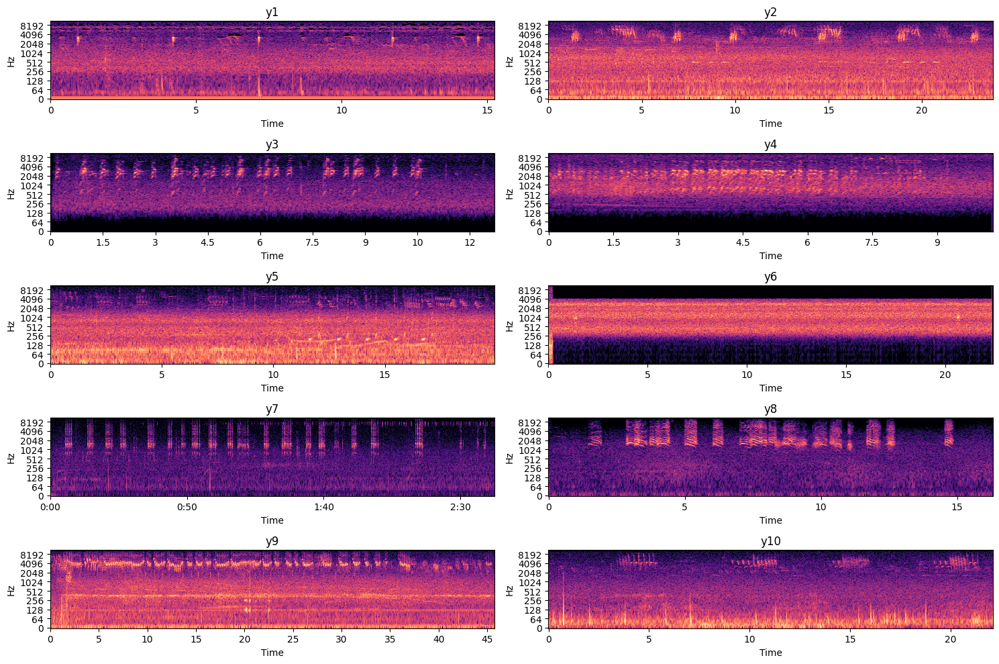

In [389]:
# Plot spectrograms using STFT
plt.figure(figsize=(15, 10))

plt.subplot(5, 2, 1)
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y1)), ref=np.max)
librosa.display.specshow(D1, sr=sr1, x_axis='time', y_axis='log')
plt.title('y1')

plt.subplot(5, 2, 2)
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max)
librosa.display.specshow(D2, sr=sr2, x_axis='time', y_axis='log')
plt.title('y2')

plt.subplot(5, 2, 3)
D3 = librosa.amplitude_to_db(np.abs(librosa.stft(y3)), ref=np.max)
librosa.display.specshow(D3, sr=sr3, x_axis='time', y_axis='log')
plt.title('y3')

plt.subplot(5, 2, 4)
D4 = librosa.amplitude_to_db(np.abs(librosa.stft(y4)), ref=np.max)
librosa.display.specshow(D4, sr=sr4, x_axis='time', y_axis='log')
plt.title('y4')

plt.subplot(5, 2, 5)
D5 = librosa.amplitude_to_db(np.abs(librosa.stft(y5)), ref=np.max)
librosa.display.specshow(D5, sr=sr5, x_axis='time', y_axis='log')
plt.title('y5')

plt.subplot(5, 2, 6)
D6 = librosa.amplitude_to_db(np.abs(librosa.stft(y6)), ref=np.max)
librosa.display.specshow(D6, sr=sr6, x_axis='time', y_axis='log')
plt.title('y6')

plt.subplot(5, 2, 7)
D7 = librosa.amplitude_to_db(np.abs(librosa.stft(y7)), ref=np.max)
librosa.display.specshow(D7, sr=sr7, x_axis='time', y_axis='log')
plt.title('y7')

plt.subplot(5, 2, 8)
D8 = librosa.amplitude_to_db(np.abs(librosa.stft(y8)), ref=np.max)
librosa.display.specshow(D8, sr=sr8, x_axis='time', y_axis='log')
plt.title('y8')

plt.subplot(5, 2, 9)
D9 = librosa.amplitude_to_db(np.abs(librosa.stft(y9)), ref=np.max)
librosa.display.specshow(D9, sr=sr9, x_axis='time', y_axis='log')
plt.title('y9')

plt.subplot(5, 2, 10)
D10 = librosa.amplitude_to_db(np.abs(librosa.stft(y10)), ref=np.max)
librosa.display.specshow(D10, sr=sr10, x_axis='time', y_axis='log')
plt.title('y10')

plt.tight_layout()
plt.show()

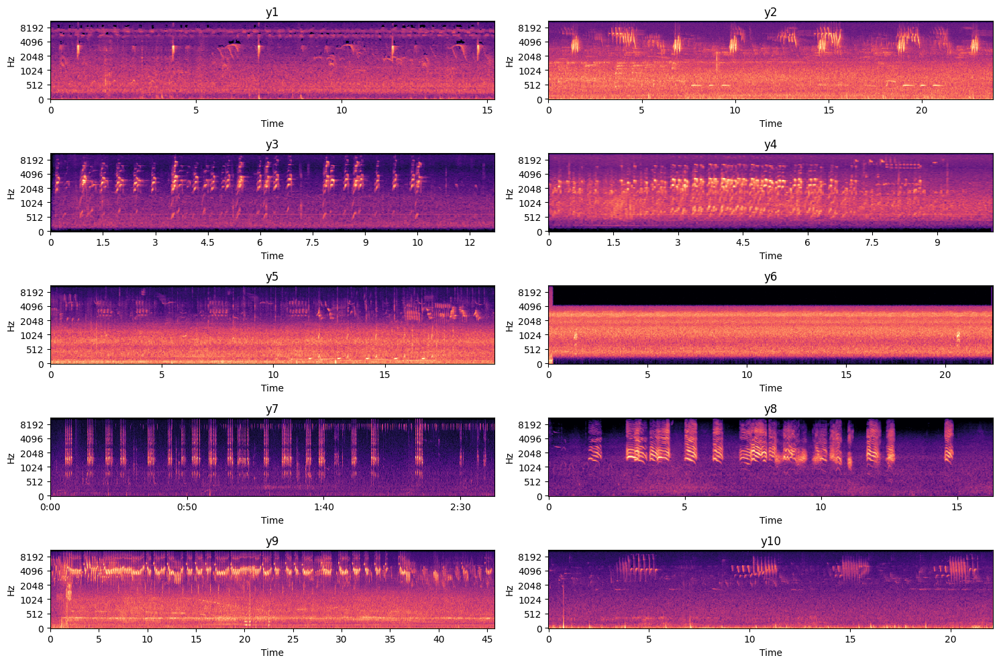

In [390]:
plt.figure(figsize=(15, 10))

plt.subplot(5, 2, 1)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y1, sr=sr1), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y1')

plt.subplot(5, 2, 2)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y2, sr=sr2), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y2')

plt.subplot(5, 2, 3)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y3, sr=sr3), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y3')

plt.subplot(5, 2, 4)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y4, sr=sr4), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y4')

plt.subplot(5, 2, 5)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y5, sr=sr5), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y5')

plt.subplot(5, 2, 6)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y6, sr=sr6), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y6')

plt.subplot(5, 2, 7)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y7, sr=sr7), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y7')

plt.subplot(5, 2, 8)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y8, sr=sr8), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y8')

plt.subplot(5, 2, 9)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y9, sr=sr9), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y9')

plt.subplot(5, 2, 10)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y10, sr=sr10), ref=np.max), y_axis='mel', x_axis='time')
plt.title('y10')

plt.tight_layout()
plt.show()

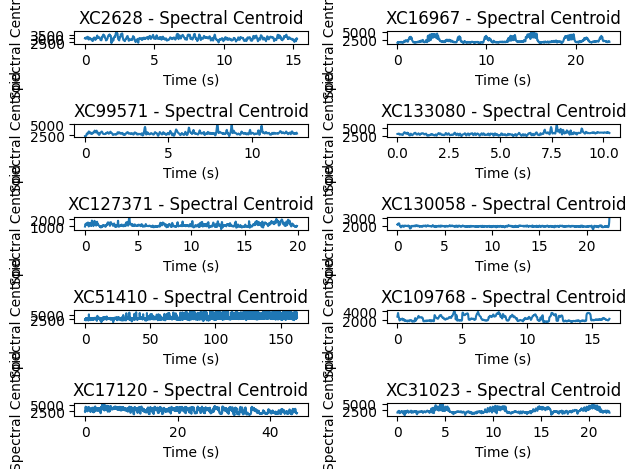

In [391]:
def plot_spectral_centroid(y, sr, subplot_index, title):
    plt.subplot(5, 2, subplot_index)
    centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    centroids = centroids + 1e-10  # Add a small constant to avoid division by zero
    times = librosa.times_like(centroids)
    plt.plot(times, centroids)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Spectral Centroid')

plot_spectral_centroid(y1, sr1, 1, 'XC2628 - Spectral Centroid')
plot_spectral_centroid(y2, sr2, 2, 'XC16967 - Spectral Centroid')
plot_spectral_centroid(y3, sr3, 3, 'XC99571 - Spectral Centroid')
plot_spectral_centroid(y4, sr4, 4, 'XC133080 - Spectral Centroid')
plot_spectral_centroid(y5, sr5, 5, 'XC127371 - Spectral Centroid')
plot_spectral_centroid(y6, sr6, 6, 'XC130058 - Spectral Centroid')
plot_spectral_centroid(y7, sr7, 7, 'XC51410 - Spectral Centroid')
plot_spectral_centroid(y8, sr8, 8, 'XC109768 - Spectral Centroid')
plot_spectral_centroid(y9, sr9, 9, 'XC17120 - Spectral Centroid')
plot_spectral_centroid(y10, sr10, 10, 'XC31023 - Spectral Centroid')

plt.tight_layout()
plt.show()

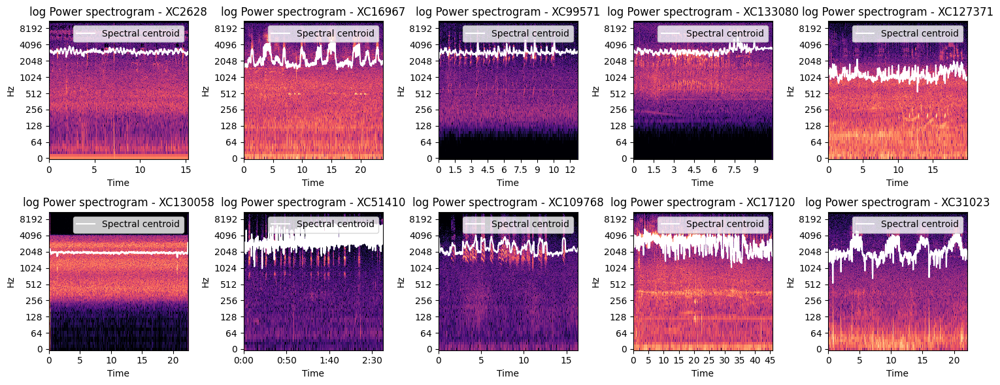

In [392]:
# List of audio file paths
audio_files = [
    "/kaggle/input/birdsong-recognition/train_audio/aldfly/XC2628.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/aldfly/XC16967.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/ameavo/XC99571.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/ameavo/XC133080.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/amebit/XC127371.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/amebit/XC130058.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/amecro/XC51410.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/amecro/XC109768.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/amegfi/XC17120.mp3",
    "/kaggle/input/birdsong-recognition/train_audio/amegfi/XC31023.mp3",
]
def calculate_magnitude_phase(y, sr):
    stft_result = librosa.stft(y)
    magnitude, phase = librosa.magphase(stft_result)
    return magnitude, phase

# Create a 2x5 subplot grid
fig, axs = plt.subplots(2, 5, figsize=(15, 6))
axs = axs.flatten()

for i, audio_path in enumerate(audio_files):
    # Load audio
    y, sr = librosa.load(audio_path)

    # Compute spectral centroid
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr)

    # Compute magnitude and phase
    magnitude, phase = calculate_magnitude_phase(y, sr)

    # Plot spectrogram with spectral centroid
    times = librosa.times_like(centroid)
    librosa.display.specshow(librosa.amplitude_to_db(magnitude, ref=np.max),
                             y_axis='log', x_axis='time', ax=axs[i])
    axs[i].plot(times, centroid.T, label='Spectral centroid', color='w')
    axs[i].legend(loc='upper right')
    axs[i].set(title=f'log Power spectrogram - {audio_path.split("/")[-1][:-4]}')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

In [393]:
zcr1 = librosa.feature.zero_crossing_rate(y1)
print(zcr1)
print("zcr1")
print('max:',zcr1.max())
print('min:',zcr1.min())
print("-------------------------------")
zcr2 = librosa.feature.zero_crossing_rate(y2)
print("zcr2")
print('max:',zcr2.max())
print('min:',zcr2.min())

[[0.11279297 0.16699219 0.21679688 0.20117188 0.19042969 0.19921875
  0.21289062 0.22021484 0.23144531 0.20996094 0.19482422 0.19091797
  0.20117188 0.22802734 0.24804688 0.26855469 0.25537109 0.24951172
  0.23876953 0.21337891 0.21289062 0.18701172 0.17626953 0.17236328
  0.16601562 0.18798828 0.20019531 0.21484375 0.23535156 0.22265625
  0.20898438 0.19189453 0.18457031 0.18945312 0.18945312 0.20263672
  0.20898438 0.23046875 0.25341797 0.26171875 0.26757812 0.26220703
  0.26269531 0.26708984 0.26025391 0.26171875 0.24365234 0.22802734
  0.23144531 0.20214844 0.19140625 0.1875     0.18505859 0.21289062
  0.23193359 0.25537109 0.26464844 0.25634766 0.26171875 0.25341797
  0.23974609 0.234375   0.22363281 0.20605469 0.19140625 0.18652344
  0.171875   0.17578125 0.18457031 0.19921875 0.22363281 0.23876953
  0.25       0.24707031 0.25683594 0.27148438 0.26611328 0.2734375
  0.26611328 0.23730469 0.23193359 0.20458984 0.20214844 0.18457031
  0.1796875  0.19726562 0.18359375 0.19482422 0.2

In [394]:
zcr3 = librosa.feature.zero_crossing_rate(y3)
print("zcr3")
print('max:',zcr3.max())
print('min:',zcr3.min())
print("-------------------------------")
zcr4 = librosa.feature.zero_crossing_rate(y4)
print("zcr4")
print('max:',zcr4.max())
print('min:',zcr4.min())

zcr3
max: 0.39501953125
min: 0.10400390625
-------------------------------
zcr4
max: 0.49755859375
min: 0.1396484375


In [395]:
zcr5 = librosa.feature.zero_crossing_rate(y5)
print("zcr5")
print('max:',zcr5.max())
print('min:',zcr5.min())
print("-------------------------------")
zcr6 = librosa.feature.zero_crossing_rate(y6)
print("zcr6")
print('max:',zcr6.max())
print('min:',zcr6.min())

zcr5
max: 0.20654296875
min: 0.0185546875
-------------------------------
zcr6
max: 0.216796875
min: 0.025390625


In [396]:
zcr7 = librosa.feature.zero_crossing_rate(y7)
print("zcr7")
print('max:',zcr7.max())
print('min:',zcr7.min())
print("-------------------------------")
zcr8 = librosa.feature.zero_crossing_rate(y8)
print("zcr8")
print('max:',zcr8.max())
print('min:',zcr8.min())

zcr7
max: 0.64501953125
min: 0.02685546875
-------------------------------
zcr8
max: 0.240234375
min: 0.0869140625


In [397]:
zcr9 = librosa.feature.zero_crossing_rate(y9)
print("zcr9")
print('max:',zcr9.max())
print('min:',zcr9.min())
print("-------------------------------")
zcr10 = librosa.feature.zero_crossing_rate(y10)
print("zcr10")
print('max:',zcr10.max())
print('min:',zcr10.min())

zcr9
max: 0.4814453125
min: 0.0400390625
-------------------------------
zcr10
max: 0.380859375
min: 0.0029296875


# RMS ENERGY

In [398]:
#energy (rms)
energy1 = librosa.feature.rms(y=y1)
print(energy1)
print('energy1')
print('max:',energy1.max())
print('min:',energy1.min())
print('mean:',energy1.mean())
print("-------------------------------")
energy2 = librosa.feature.rms(y=y2)
print('energy2')
print('max:',energy2.max())
print('min:',energy2.min())
print('mean:',energy2.mean())

[[0.00589646 0.00836437 0.01031462 0.0116822  0.01199952 0.01172375
  0.01151024 0.01147852 0.01122747 0.01147238 0.01205219 0.0126301
  0.01304015 0.01359487 0.01510912 0.01560178 0.0165572  0.01689621
  0.01570674 0.01508682 0.01366628 0.0133209  0.01314884 0.01308384
  0.0133078  0.01263241 0.01252797 0.01294012 0.01272948 0.01278813
  0.01279435 0.01249812 0.01251407 0.01294355 0.01308958 0.01316668
  0.01381811 0.01360981 0.01351538 0.10020005 0.13938951 0.13973294
  0.13993436 0.09876198 0.01911558 0.01649999 0.01502973 0.01404099
  0.01399049 0.01387421 0.0131836  0.01310053 0.01258725 0.01255072
  0.01321087 0.01318502 0.01313182 0.01331147 0.01325255 0.01340035
  0.01361026 0.01386832 0.01333279 0.0132126  0.01316093 0.01261729
  0.01283787 0.01243517 0.01227761 0.01272287 0.01263419 0.01315357
  0.01384945 0.01408125 0.01439398 0.01429765 0.01424194 0.01515313
  0.01560326 0.01686153 0.02232153 0.0221464  0.02258983 0.02291811
  0.01694172 0.01630095 0.01666285 0.01603579 0.0

In [399]:
#energy (rms)
energy3 = librosa.feature.rms(y=y3)
print('energy3')
print('max:',energy3.max())
print('min:',energy3.min())
print('mean:',energy3.mean())
print("-------------------------------")
energy4 = librosa.feature.rms(y=y4)
print('energy4')
print('max:',energy4.max())
print('min:',energy4.min())
print('mean:',energy4.mean())

energy3
max: 0.308745
min: 0.0007064902
mean: 0.03630256
-------------------------------
energy4
max: 0.108768515
min: 0.0050918953
mean: 0.03041746


In [400]:
#energy (rms)
energy5 = librosa.feature.rms(y=y5)
print('energy5')
print('max:',energy5.max())
print('min:',energy5.min())
print('mean:',energy5.mean())
print("-------------------------------")
energy6 = librosa.feature.rms(y=y6)
print('energy6')
print('max:',energy6.max())
print('min:',energy6.min())
print('mean:',energy6.mean())

energy5
max: 0.09951094
min: 0.02622654
mean: 0.039170116
-------------------------------
energy6
max: 0.006229232
min: 0.00026452466
mean: 0.0027368567


In [401]:
#energy (rms)
energy7 = librosa.feature.rms(y=y7)
print('energy7')
print('max:',energy7.max())
print('min:',energy7.min())
print('mean:',energy7.mean())
print("-------------------------------")
energy8 = librosa.feature.rms(y=y8)
print('energy8')
print('max:',energy8.max())
print('min:',energy8.min())
print('mean:',energy8.mean())

energy7
max: 0.31693923
min: 0.002186899
mean: 0.022645555
-------------------------------
energy8
max: 0.24768768
min: 0.0021838462
mean: 0.04979504


In [402]:
#energy (rms)
energy9 = librosa.feature.rms(y=y9)
print('energy9')
print('max:',energy9.max())
print('min:',energy9.min())
print('mean:',energy9.mean())
print("-------------------------------")
energy10 = librosa.feature.rms(y=y10)
print('energy10')
print('max:',energy10.max())
print('min:',energy10.min())
print('mean:',energy10.mean())

energy9
max: 0.20296344
min: 0.012627823
mean: 0.08758347
-------------------------------
energy10
max: 0.22266662
min: 0.014602625
mean: 0.045978323


# MFCC

In [403]:
mfcc1 = librosa.feature.mfcc(y=y1, sr=sr1)
print(mfcc1)
print("mfcc1")
print("max of mean-mfcc:",np.mean(mfcc1, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc1, axis=1).min())
mfcc2 = librosa.feature.mfcc(y=y2, sr=sr2)
print("mfcc2")
print("max of mean-mfcc:",np.mean(mfcc2, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc2, axis=1).min())
mfcc3 = librosa.feature.mfcc(y=y3, sr=sr3)
print("mfcc3")
print("max of mean-mfcc:",np.mean(mfcc3, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc3, axis=1).min())
mfcc4 = librosa.feature.mfcc(y=y4, sr=sr4)
print("mfcc4")
print("max of mean-mfcc:",np.mean(mfcc4, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc4, axis=1).min())
mfcc5 = librosa.feature.mfcc(y=y5, sr=sr5)
print("mfcc5")
print("max of mean-mfcc:",np.mean(mfcc5, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc5, axis=1).min())
mfcc6 = librosa.feature.mfcc(y=y6, sr=sr6)
print("mfcc6")
print("max of mean-mfcc:",np.mean(mfcc6, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc6, axis=1).min())
mfcc7 = librosa.feature.mfcc(y=y7, sr=sr7)
print("mfcc7")
print("max of mean-mfcc:",np.mean(mfcc7, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc7, axis=1).min())
mfcc8 = librosa.feature.mfcc(y=y8, sr=sr8)
print("mfcc8")
print("max of mean-mfcc:",np.mean(mfcc8, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc8, axis=1).min())
mfcc9 = librosa.feature.mfcc(y=y9, sr=sr9)
print("mfcc9")
print("max of mean-mfcc:",np.mean(mfcc9, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc9, axis=1).min())
mfcc10 = librosa.feature.mfcc(y=y10, sr=sr10)
print("mfcc10")
print("max of mean-mfcc:",np.mean(mfcc10, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc10, axis=1).min())

[[-428.30127   -298.37497   -266.1983    ... -252.40906   -259.07733
  -291.81418  ]
 [  77.119705    83.33185     83.59476   ...   95.088776    86.23932
    88.627716 ]
 [  10.230509     6.423517     3.9072404 ...    1.6074095    2.5694664
     7.2360096]
 ...
 [   7.268918     6.9871716    0.940288  ...    3.817382     6.435815
     3.9457283]
 [  17.57957     12.667892     6.431737  ...   12.373859     8.937332
     5.985053 ]
 [   5.0346646    3.1869347   -4.846538  ...    2.3994246    5.38351
     7.34778  ]]
mfcc1
max of mean-mfcc: 82.09211
min of mean-mfcc: -252.40382
mfcc2
max of mean-mfcc: 109.145485
min of mean-mfcc: -204.88855
mfcc3
max of mean-mfcc: 61.738323
min of mean-mfcc: -282.5254
mfcc4
max of mean-mfcc: 34.119373
min of mean-mfcc: -255.63048
mfcc5
max of mean-mfcc: 170.73468
min of mean-mfcc: -242.49837
mfcc6
max of mean-mfcc: 170.82878
min of mean-mfcc: -544.754
mfcc7
max of mean-mfcc: 64.43917
min of mean-mfcc: -317.03186
mfcc8
max of mean-mfcc: 63.210934
min of me

In [404]:
# Compute pitches using the Harmonic-Percussive source separation
y_harmonic1, y_percussive1 = librosa.effects.hpss(y1)
y_harmonic2, y_percussive2 = librosa.effects.hpss(y2)
y_harmonic3, y_percussive3 = librosa.effects.hpss(y3)
y_harmonic4, y_percussive4 = librosa.effects.hpss(y4)
y_harmonic5, y_percussive5 = librosa.effects.hpss(y5)
y_harmonic6, y_percussive6 = librosa.effects.hpss(y6)
y_harmonic7, y_percussive7 = librosa.effects.hpss(y7)
y_harmonic8, y_percussive8 = librosa.effects.hpss(y8)
y_harmonic9, y_percussive9 = librosa.effects.hpss(y9)
y_harmonic10, y_percussive10 = librosa.effects.hpss(y10)

In [405]:
# Compute pitches
pitches1, magnitudes1 = librosa.core.piptrack(y=y_harmonic1, sr=sr1)
pitches2, magnitudes2 = librosa.core.piptrack(y=y_harmonic2, sr=sr2)
pitches3, magnitudes3 = librosa.core.piptrack(y=y_harmonic3, sr=sr3)
pitches4, magnitudes4 = librosa.core.piptrack(y=y_harmonic4, sr=sr4)
pitches5, magnitudes5 = librosa.core.piptrack(y=y_harmonic5, sr=sr5)
pitches6, magnitudes6 = librosa.core.piptrack(y=y_harmonic6, sr=sr6)
pitches7, magnitudes7 = librosa.core.piptrack(y=y_harmonic7, sr=sr7)
pitches8, magnitudes8 = librosa.core.piptrack(y=y_harmonic8, sr=sr8)
pitches9, magnitudes9 = librosa.core.piptrack(y=y_harmonic9, sr=sr9)
pitches10, magnitudes10 = librosa.core.piptrack(y=y_harmonic10, sr=sr10)


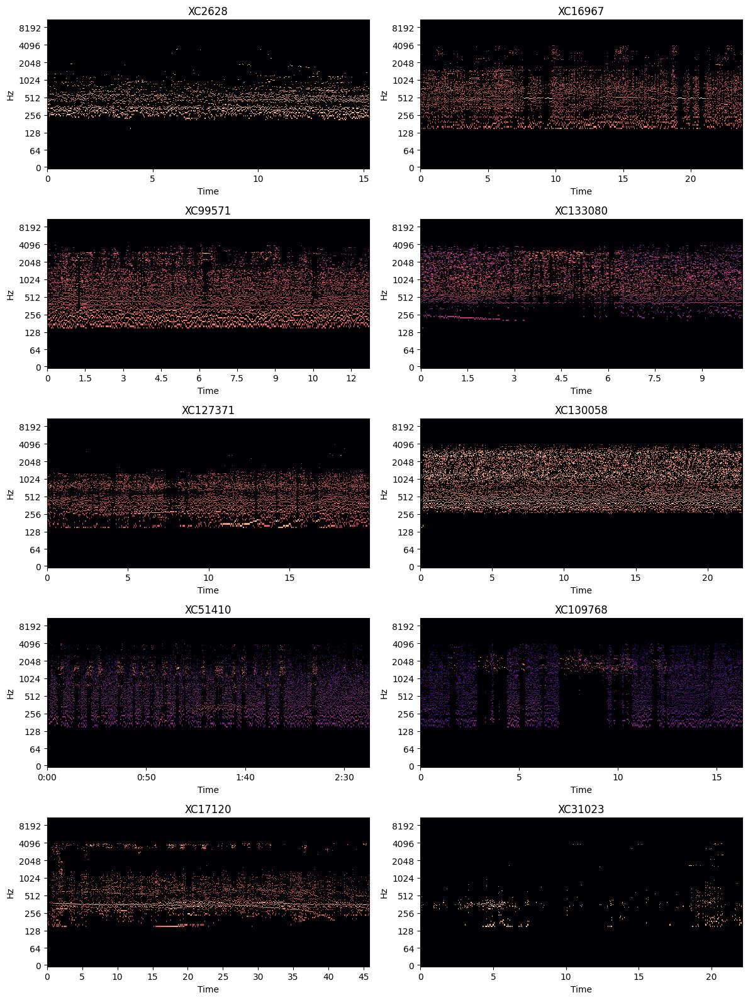

In [406]:
# Plot pitches
plt.figure(figsize=(12, 16))

plt.subplot(5, 2, 1)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes1, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC2628')

plt.subplot(5, 2, 2)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes2, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC16967')

plt.subplot(5, 2, 3)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes3, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC99571')

plt.subplot(5, 2, 4)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes4, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC133080')

plt.subplot(5, 2, 5)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes5, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC127371')

plt.subplot(5, 2, 6)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes6, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC130058')

plt.subplot(5, 2, 7)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes7, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC51410')

plt.subplot(5, 2, 8)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes8, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC109768')

plt.subplot(5, 2, 9)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes9, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC17120')

plt.subplot(5, 2, 10)
librosa.display.specshow(librosa.amplitude_to_db(magnitudes10, ref=np.max), y_axis='log', x_axis='time')
plt.title('XC31023')

plt.tight_layout()
plt.show()

# Model

In [407]:
import cv2
import audioread
import logging
import os
import random
import time
import warnings

import librosa
import numpy as np
import pandas as pd
import soundfile as sf
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data

from contextlib import contextmanager
from pathlib import Path
from typing import Optional

from fastprogress import progress_bar
from sklearn.metrics import f1_score
from torchvision import models

In [408]:
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    
def get_logger(out_file=None):
    logger = logging.getLogger()
    formatter = logging.Formatter("%(asctime)s - %(levelname)s - %(message)s")
    logger.handlers = []
    logger.setLevel(logging.INFO)

    handler = logging.StreamHandler()
    handler.setFormatter(formatter)
    handler.setLevel(logging.INFO)
    logger.addHandler(handler)

    if out_file is not None:
        fh = logging.FileHandler(out_file)
        fh.setFormatter(formatter)
        fh.setLevel(logging.INFO)
        logger.addHandler(fh)
    logger.info("logger set up")
    return logger
    
    
@contextmanager
def timer(name: str, logger: Optional[logging.Logger] = None):
    t0 = time.time()
    msg = f"[{name}] start"
    if logger is None:
        print(msg)
    else:
        logger.info(msg)
    yield

    msg = f"[{name}] done in {time.time() - t0:.2f} s"
    if logger is None:
        print(msg)
    else:
        logger.info(msg)

In [409]:
logger = get_logger("main.log")
set_seed(1213)

2024-01-21 17:53:23,407 - INFO - logger set up


In [410]:
TARGET_SR = 32000
TEST = Path("/kaggle/input/weights/Document from Ashutosh Anand Mehta")

In [411]:
if TEST:
    DATA_DIR = Path("../input/birdsong-recognition/")
else:
    # dataset created by @shonenkov, thanks!
    DATA_DIR = Path("../input/birdcall-check/")
    

test = pd.read_csv(DATA_DIR / "/kaggle/input/birdcall-check/test.csv")
test_audio = DATA_DIR / "/kaggle/input/birdcall-check/test_audio"



In [412]:

test.head()

,site,row_id,seconds,audio_id
0,site_1,site_1_41e6fe6504a34bf6846938ba78d13df1_5,5.0,41e6fe6504a34bf6846938ba78d13df1
1,site_1,site_1_41e6fe6504a34bf6846938ba78d13df1_10,10.0,41e6fe6504a34bf6846938ba78d13df1
2,site_1,site_1_41e6fe6504a34bf6846938ba78d13df1_15,15.0,41e6fe6504a34bf6846938ba78d13df1
3,site_1,site_1_41e6fe6504a34bf6846938ba78d13df1_20,20.0,41e6fe6504a34bf6846938ba78d13df1
4,site_1,site_1_41e6fe6504a34bf6846938ba78d13df1_25,25.0,41e6fe6504a34bf6846938ba78d13df1


In [413]:
sub = pd.read_csv("../input/birdsong-recognition/sample_submission.csv")
sub.to_csv("submission.csv", index=False)  # this will be overwritten if everything goes well

In [414]:
class ResNet(nn.Module):
    def __init__(self, base_model_name: str, pretrained=False,
                 num_classes=264):
        super().__init__()
        base_model = models.__getattribute__(base_model_name)(
            pretrained=pretrained)
        layers = list(base_model.children())[:-2]
        layers.append(nn.AdaptiveMaxPool2d(1))
        self.encoder = nn.Sequential(*layers)

        in_features = base_model.fc.in_features

        self.classifier = nn.Sequential(
            nn.Linear(in_features, 1024), nn.ReLU(), nn.Dropout(p=0.2),
            nn.Linear(1024, 1024), nn.ReLU(), nn.Dropout(p=0.2),
            nn.Linear(1024, num_classes))

    def forward(self, x):
        batch_size = x.size(0)
        x = self.encoder(x).view(batch_size, -1)
        x = self.classifier(x)
        multiclass_proba = F.softmax(x, dim=1)
        multilabel_proba = F.sigmoid(x)
        return {
            "logits": x,
            "multiclass_proba": multiclass_proba,
            "multilabel_proba": multilabel_proba
        }

In [415]:
model_config = {
    "base_model_name": "resnet50",
    "pretrained": False,
    "num_classes": 264
}

melspectrogram_parameters = {
    "n_mels": 128,
    "fmin": 20,
    "fmax": 16000
}

weights_path = "/kaggle/input/weights/Document from Ashutosh Anand Mehta"

In [416]:
from sklearn.preprocessing import LabelEncoder
df = pd.read_csv("/kaggle/input/birdsong-recognition/train.csv")

unique_bird_names = df.ebird_code.unique()
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(unique_bird_names)
BIRD_CODE = dict(zip(unique_bird_names, encoded_labels))

#for bird_name, label in BIRD_CODE.items():
#    print(f"{bird_name}:{label}")

INV_BIRD_CODE = {v: k for k, v in BIRD_CODE.items()}
#for bird_name, label in INV_BIRD_CODE.items():
#    print(f"{bird_name}:{label}")

In [417]:
def mono_to_color(X: np.ndarray,
                  mean=None,
                  std=None,
                  norm_max=None,
                  norm_min=None,
                  eps=1e-6):
    
    # Stack X as [X,X,X]
    X = np.stack([X, X, X], axis=-1)

    # Standardize
    mean = mean or X.mean()
    X = X - mean
    std = std or X.std()
    Xstd = X / (std + eps)
    _min, _max = Xstd.min(), Xstd.max()
    norm_max = norm_max or _max
    norm_min = norm_min or _min
    if (_max - _min) > eps:
        # Normalize to [0, 255]
        V = Xstd
        V[V < norm_min] = norm_min
        V[V > norm_max] = norm_max
        V = 255 * (V - norm_min) / (norm_max - norm_min)
        V = V.astype(np.uint8)
    else:
        # Just zero
        V = np.zeros_like(Xstd, dtype=np.uint8)
    return V


class TestDataset(data.Dataset):
    def __init__(self, df: pd.DataFrame, clip: np.ndarray,
                 img_size=224, melspectrogram_parameters={}):
        self.df = df
        self.clip = clip
        self.img_size = img_size
        self.melspectrogram_parameters = melspectrogram_parameters
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx: int):
        SR = 32000
        sample = self.df.loc[idx, :]
        site = sample.site
        row_id = sample.row_id
        
        if site == "site_3":
            y = self.clip.astype(np.float32)
            len_y = len(y)
            start = 0
            end = SR * 5
            images = []
            while len_y > start:
                y_batch = y[start:end].astype(np.float32)
                if len(y_batch) != (SR * 5):
                    break
                start = end
                end = end + SR * 5
                
                melspec = librosa.feature.melspectrogram(y_batch,
                                                         sr=SR,
                                                         **self.melspectrogram_parameters)
                melspec = librosa.power_to_db(melspec).astype(np.float32)
                image = mono_to_color(melspec)
                height, width, _ = image.shape
                image = cv2.resize(image, (int(width * self.img_size / height), self.img_size))
                image = np.moveaxis(image, 2, 0)
                image = (image / 255.0).astype(np.float32)
                images.append(image)
            images = np.asarray(images)
            return images, row_id, site
        else:
            end_seconds = int(sample.seconds)
            start_seconds = int(end_seconds - 5)
            
            start_index = SR * start_seconds
            end_index = SR * end_seconds
            
            y = self.clip[start_index:end_index].astype(np.float32)

            melspec = librosa.feature.melspectrogram(y, sr=SR, **self.melspectrogram_parameters)
            melspec = librosa.power_to_db(melspec).astype(np.float32)

            image = mono_to_color(melspec)
            height, width, _ = image.shape
            image = cv2.resize(image, (int(width * self.img_size / height), self.img_size))
            image = np.moveaxis(image, 2, 0)
            image = (image / 255.0).astype(np.float32)

            return image, row_id, site

In [418]:
def get_model(config: dict, weights_path: str):
    model = ResNet(**config)
    checkpoint = torch.load(weights_path, map_location=torch.device('cpu'))
    model.load_state_dict(checkpoint["model_state_dict"])
    device = torch.device('cpu')
    model.to(device)
    model.eval()
    return model

In [419]:
def prediction_for_clip(test_df: pd.DataFrame, 
                        clip: np.ndarray, 
                        model: ResNet, 
                        mel_params: dict, 
                        threshold=0.5):

    dataset = TestDataset(df=test_df, 
                          clip=clip,
                          img_size=224,
                          melspectrogram_parameters=mel_params)
    loader = data.DataLoader(dataset, batch_size=1, shuffle=False)
    device = torch.device('cpu')
    
    model.eval()
    prediction_dict = {}
    for image, row_id, site in progress_bar(loader):
        site = site[0]
        row_id = row_id[0]
        if site in {"site_1", "site_2"}:
            image = image.to(device)

            with torch.no_grad():
                prediction = model(image)
                proba = prediction["multilabel_proba"].detach().cpu().numpy().reshape(-1)

            events = proba >= threshold
            labels = np.argwhere(events).reshape(-1).tolist()

        else:
            # to avoid prediction on large batch
            image = image.squeeze(0)
            batch_size = 16
            whole_size = image.size(0)
            if whole_size % batch_size == 0:
                n_iter = whole_size // batch_size
            else:
                n_iter = whole_size // batch_size + 1
                
            all_events = set()
            for batch_i in range(n_iter):
                batch = image[batch_i * batch_size:(batch_i + 1) * batch_size]
                if batch.ndim == 3:
                    batch = batch.unsqueeze(0)

                batch = batch.to(device)
                with torch.no_grad():
                    prediction = model(batch)
                    proba = prediction["multilabel_proba"].detach().cpu().numpy()
                    
                events = proba >= threshold
                for i in range(len(events)):
                    event = events[i, :]
                    labels = np.argwhere(event).reshape(-1).tolist()
                    for label in labels:
                        all_events.add(label)
                        
            labels = list(all_events)
        if len(labels) == 0:
            prediction_dict[row_id] = "nocall"
        else:
            labels_str_list = list(map(lambda x: INV_BIRD_CODE[x], labels))
            label_string = " ".join(labels_str_list)
            prediction_dict[row_id] = label_string
    return prediction_dict

In [420]:
def prediction(test_df: pd.DataFrame,
               test_audio: Path,
               model_config: dict,
               mel_params: dict,
               weights_path: str,
               threshold=0.5):
    model = get_model(model_config, weights_path)
    unique_audio_id = test_df.audio_id.unique()

    warnings.filterwarnings("ignore")
    prediction_dfs = []
    for audio_id in unique_audio_id:
        with timer(f"Loading {audio_id}", logger):
            clip, _ = librosa.load(test_audio / (audio_id + ".mp3"),
                                   sr=TARGET_SR,
                                   mono=True)
        
        test_df_for_audio_id = test_df.query(
            f"audio_id == '{audio_id}'").reset_index(drop=True)
        with timer(f"Prediction on {audio_id}", logger):
            prediction_dict = prediction_for_clip(test_df_for_audio_id,
                                                  clip=clip,
                                                  model=model,
                                                  mel_params=mel_params,
                                                  threshold=threshold)
        row_id = list(prediction_dict.keys())
        birds = list(prediction_dict.values())
        prediction_df = pd.DataFrame({
            "row_id": row_id,
            "birds": birds
        })
        prediction_dfs.append(prediction_df)
    
    prediction_df = pd.concat(prediction_dfs, axis=0, sort=False).reset_index(drop=True)
    return prediction_df

In [421]:
submission = prediction(test_df=test,
                        test_audio=test_audio,
                        model_config=model_config,
                        mel_params=melspectrogram_parameters,
                        weights_path=weights_path,
                        threshold=0.8)


2024-01-21 17:53:24,415 - INFO - [Loading 41e6fe6504a34bf6846938ba78d13df1] start
2024-01-21 17:53:25,079 - INFO - [Loading 41e6fe6504a34bf6846938ba78d13df1] done in 0.66 s
2024-01-21 17:53:25,085 - INFO - [Prediction on 41e6fe6504a34bf6846938ba78d13df1] start


2024-01-21 17:53:26,645 - INFO - [Prediction on 41e6fe6504a34bf6846938ba78d13df1] done in 1.56 s
2024-01-21 17:53:26,647 - INFO - [Loading cce64fffafed40f2b2f3d3413ec1c4c2] start
2024-01-21 17:53:27,713 - INFO - [Loading cce64fffafed40f2b2f3d3413ec1c4c2] done in 1.07 s
2024-01-21 17:53:27,718 - INFO - [Prediction on cce64fffafed40f2b2f3d3413ec1c4c2] start


2024-01-21 17:53:29,993 - INFO - [Prediction on cce64fffafed40f2b2f3d3413ec1c4c2] done in 2.27 s
2024-01-21 17:53:29,998 - INFO - [Loading 99af324c881246949408c0b1ae54271f] start
2024-01-21 17:53:31,238 - INFO - [Loading 99af324c881246949408c0b1ae54271f] done in 1.24 s
2024-01-21 17:53:31,244 - INFO - [Prediction on 99af324c881246949408c0b1ae54271f] start


2024-01-21 17:53:33,459 - INFO - [Prediction on 99af324c881246949408c0b1ae54271f] done in 2.22 s
2024-01-21 17:53:33,461 - INFO - [Loading 6ab74e177aa149468a39ca10beed6222] start
2024-01-21 17:53:34,478 - INFO - [Loading 6ab74e177aa149468a39ca10beed6222] done in 1.02 s
2024-01-21 17:53:34,482 - INFO - [Prediction on 6ab74e177aa149468a39ca10beed6222] start


2024-01-21 17:53:36,380 - INFO - [Prediction on 6ab74e177aa149468a39ca10beed6222] done in 1.90 s
2024-01-21 17:53:36,382 - INFO - [Loading b2fd3f01e9284293a1e33f9c811a2ed6] start
2024-01-21 17:53:37,457 - INFO - [Loading b2fd3f01e9284293a1e33f9c811a2ed6] done in 1.07 s
2024-01-21 17:53:37,461 - INFO - [Prediction on b2fd3f01e9284293a1e33f9c811a2ed6] start


2024-01-21 17:53:39,617 - INFO - [Prediction on b2fd3f01e9284293a1e33f9c811a2ed6] done in 2.16 s
2024-01-21 17:53:39,619 - INFO - [Loading de62b37ebba749d2abf29d4a493ea5d4] start
2024-01-21 17:53:39,852 - INFO - [Loading de62b37ebba749d2abf29d4a493ea5d4] done in 0.23 s
2024-01-21 17:53:39,856 - INFO - [Prediction on de62b37ebba749d2abf29d4a493ea5d4] start


2024-01-21 17:53:40,179 - INFO - [Prediction on de62b37ebba749d2abf29d4a493ea5d4] done in 0.32 s
2024-01-21 17:53:40,180 - INFO - [Loading 8680a8dd845d40f296246dbed0d37394] start
2024-01-21 17:53:41,507 - INFO - [Loading 8680a8dd845d40f296246dbed0d37394] done in 1.33 s
2024-01-21 17:53:41,511 - INFO - [Prediction on 8680a8dd845d40f296246dbed0d37394] start


2024-01-21 17:53:44,214 - INFO - [Prediction on 8680a8dd845d40f296246dbed0d37394] done in 2.70 s
2024-01-21 17:53:44,217 - INFO - [Loading 940d546e5eb745c9a74bce3f35efa1f9] start
2024-01-21 17:53:46,347 - INFO - [Loading 940d546e5eb745c9a74bce3f35efa1f9] done in 2.13 s
2024-01-21 17:53:46,352 - INFO - [Prediction on 940d546e5eb745c9a74bce3f35efa1f9] start


2024-01-21 17:53:50,729 - INFO - [Prediction on 940d546e5eb745c9a74bce3f35efa1f9] done in 4.38 s
2024-01-21 17:53:50,731 - INFO - [Loading 07ab324c602e4afab65ddbcc746c31b5] start
2024-01-21 17:53:51,523 - INFO - [Loading 07ab324c602e4afab65ddbcc746c31b5] done in 0.79 s
2024-01-21 17:53:51,528 - INFO - [Prediction on 07ab324c602e4afab65ddbcc746c31b5] start


2024-01-21 17:53:53,097 - INFO - [Prediction on 07ab324c602e4afab65ddbcc746c31b5] done in 1.57 s
2024-01-21 17:53:53,098 - INFO - [Loading 899616723a32409c996f6f3441646c2a] start
2024-01-21 17:53:54,500 - INFO - [Loading 899616723a32409c996f6f3441646c2a] done in 1.40 s
2024-01-21 17:53:54,504 - INFO - [Prediction on 899616723a32409c996f6f3441646c2a] start


2024-01-21 17:53:57,578 - INFO - [Prediction on 899616723a32409c996f6f3441646c2a] done in 3.07 s
2024-01-21 17:53:57,580 - INFO - [Loading 9cc5d9646f344f1bbb52640a988fe902] start
2024-01-21 17:54:04,656 - INFO - [Loading 9cc5d9646f344f1bbb52640a988fe902] done in 7.08 s
2024-01-21 17:54:04,661 - INFO - [Prediction on 9cc5d9646f344f1bbb52640a988fe902] start


2024-01-21 17:54:20,929 - INFO - [Prediction on 9cc5d9646f344f1bbb52640a988fe902] done in 16.27 s
2024-01-21 17:54:20,930 - INFO - [Loading a56e20a518684688a9952add8a9d5213] start
2024-01-21 17:54:21,850 - INFO - [Loading a56e20a518684688a9952add8a9d5213] done in 0.92 s
2024-01-21 17:54:21,859 - INFO - [Prediction on a56e20a518684688a9952add8a9d5213] start


2024-01-21 17:54:23,567 - INFO - [Prediction on a56e20a518684688a9952add8a9d5213] done in 1.71 s
2024-01-21 17:54:23,569 - INFO - [Loading 96779836288745728306903d54e264dd] start
2024-01-21 17:54:24,156 - INFO - [Loading 96779836288745728306903d54e264dd] done in 0.59 s
2024-01-21 17:54:24,161 - INFO - [Prediction on 96779836288745728306903d54e264dd] start


2024-01-21 17:54:24,940 - INFO - [Prediction on 96779836288745728306903d54e264dd] done in 0.78 s
2024-01-21 17:54:24,941 - INFO - [Loading f77783ba4c6641bc918b034a18c23e53] start
2024-01-21 17:54:25,245 - INFO - [Loading f77783ba4c6641bc918b034a18c23e53] done in 0.30 s
2024-01-21 17:54:25,249 - INFO - [Prediction on f77783ba4c6641bc918b034a18c23e53] start


2024-01-21 17:54:25,569 - INFO - [Prediction on f77783ba4c6641bc918b034a18c23e53] done in 0.32 s
2024-01-21 17:54:25,571 - INFO - [Loading 856b194b097441958697c2bcd1f63982] start
2024-01-21 17:54:26,408 - INFO - [Loading 856b194b097441958697c2bcd1f63982] done in 0.84 s
2024-01-21 17:54:26,412 - INFO - [Prediction on 856b194b097441958697c2bcd1f63982] start


2024-01-21 17:54:27,647 - INFO - [Prediction on 856b194b097441958697c2bcd1f63982] done in 1.23 s


In [422]:
submission.to_csv("submission.csv", index=False)

In [423]:
submission

,row_id,birds
0,site_1_41e6fe6504a34bf6846938ba78d13df1_5,aldfly
1,site_1_41e6fe6504a34bf6846938ba78d13df1_10,aldfly
2,site_1_41e6fe6504a34bf6846938ba78d13df1_15,aldfly
3,site_1_41e6fe6504a34bf6846938ba78d13df1_20,nocall
4,site_1_41e6fe6504a34bf6846938ba78d13df1_25,aldfly
...,...,...
71,site_3_9cc5d9646f344f1bbb52640a988fe902,aldfly
72,site_3_a56e20a518684688a9952add8a9d5213,aldfly
73,site_3_96779836288745728306903d54e264dd,aldfly
74,site_3_f77783ba4c6641bc918b034a18c23e53,aldfly


In [424]:
submission.row_id.unique()

array(['site_1_41e6fe6504a34bf6846938ba78d13df1_5',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_10',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_15',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_20',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_25',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_5',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_10',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_15',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_20',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_25',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_30',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_35',
       'site_1_99af324c881246949408c0b1ae54271f_5',
       'site_1_99af324c881246949408c0b1ae54271f_10',
       'site_1_99af324c881246949408c0b1ae54271f_15',
       'site_1_99af324c881246949408c0b1ae54271f_20',
       'site_1_99af324c881246949408c0b1ae54271f_25',
       'site_1_99af324c881246949408c0b1ae54271f_30',
       'site_1_99af324c881246949408c0b1ae54271f_3

In [425]:
df1 = pd.read_csv("/kaggle/working/submission.csv")

# Remove trailing numbers and duplicates from 'row_id' column
df1['row_id'] = df1['row_id'].replace(to_replace=r'_[0-9]+$', value='', regex=True)
df1 = df1.drop_duplicates()
rows = df1[df1.duplicated(subset=['row_id'], keep=False) & (df1['birds'] == 'nocall')]
df_no_duplicates = df1.drop(rows.index)

df_no_duplicates = df_no_duplicates.reset_index(drop=True)

df_no_duplicates

,row_id,birds
0,site_1_41e6fe6504a34bf6846938ba78d13df1,aldfly
1,site_1_cce64fffafed40f2b2f3d3413ec1c4c2,aldfly
2,site_1_99af324c881246949408c0b1ae54271f,aldfly
3,site_1_6ab74e177aa149468a39ca10beed6222,aldfly
4,site_1_b2fd3f01e9284293a1e33f9c811a2ed6,aldfly
5,site_2_de62b37ebba749d2abf29d4a493ea5d4,aldfly
6,site_2_8680a8dd845d40f296246dbed0d37394,aldfly
7,site_2_940d546e5eb745c9a74bce3f35efa1f9,aldfly
8,site_2_07ab324c602e4afab65ddbcc746c31b5,aldfly
9,site_2_899616723a32409c996f6f3441646c2a,nocall
